In [1]:
import requests
from bs4 import BeautifulSoup
import pandas as pd
import numpy as np
import nltk
import html2text

## Web Scraping

In [2]:
URL = 'https://holamundo.io/2023/03/20/cuando-refactorizar-codigo/'
page = requests.get(URL)
html_content = page.content

In [3]:
soup = BeautifulSoup(html_content, 'html5lib')

In [4]:
title = soup.title.string
title

'¿Cuándo refactorizar código? – Hola Mundo'

In [5]:
text = soup.get_text(strip=True)
text

'¿Cuándo refactorizar código? – Hola Mundowindow._wpemojiSettings = {"baseUrl":"https:\\/\\/s.w.org\\/images\\/core\\/emoji\\/14.0.0\\/72x72\\/","ext":".png","svgUrl":"https:\\/\\/s.w.org\\/images\\/core\\/emoji\\/14.0.0\\/svg\\/","svgExt":".svg","source":{"concatemoji":"https:\\/\\/holamundo.io\\/wp-includes\\/js\\/wp-emoji-release.min.js?ver=6.2"}};\n/*! This file is auto-generated */\n!function(e,a,t){var n,r,o,i=a.createElement("canvas"),p=i.getContext&&i.getContext("2d");function s(e,t){p.clearRect(0,0,i.width,i.height),p.fillText(e,0,0);e=i.toDataURL();return p.clearRect(0,0,i.width,i.height),p.fillText(t,0,0),e===i.toDataURL()}function c(e){var t=a.createElement("script");t.src=e,t.defer=t.type="text/javascript",a.getElementsByTagName("head")[0].appendChild(t)}for(o=Array("flag","emoji"),t.supports={everything:!0,everythingExceptFlag:!0},r=0;r<o.length;r++)t.supports[o[r]]=function(e){if(p&&p.fillText)switch(p.textBaseline="top",p.font="600 32px Arial",e){case"flag":return s("\\

In [6]:
html2text.html2text(str(html_content))

'b\'\\n\\n\\n\\n\\n\\n\\n\n\n\\n\\t\n\n\\n\n\n\\n\\t\n\n\\n\\t\\t\n\n\\n\\t\\t\n\n\\n\\t\n\n\\n\\n\\n\n\n\\n\\n\\t\n\n\\n\\n\\t\\t\\n\\t\\n\\t\\t\\n\\t\\t\\t\n\n\\n\\t\\t\\t\\t[![Hola Mundo](https://holamundo.io/wp-content/uploads/2022/12/logo-\nhola-mundo-horizontal.png)](https://holamundo.io/)[![Hola\nMundo](https://holamundo.io/wp-content/uploads/2022/12/logo-hola-mundo-\nhorizontal.png)](https://holamundo.io/)\\n\\t\\t\\t\\t\n\n\\n\\t\\t\\t\\t\\t\n\n  * [Inicio](https://holamundo.io/)\n\\n\n\n  * [Contacto](https://holamundo.io/contacto/)\n\\n\n\n  * [Cursos](https://academia.holamundo.io)\n\\n\n\n\\t\\t\\t\\t\n\n\\n\\n\\t\\t\\t\\t\\n\\t\\t\\t\\t\n\n\\n\\t\\t\\t\\t\\t\\n\\t\\t\n\n\\n\\t\\t \\t\\t\n\n  * \\n\\t\\t [\\n\\t\\t __\\n\\t\\t](http://twitter.com/_nasch_)\\n\\t\\t \n\\n\\t\\t \\t\\t\n\n  * \\n\\t\\t [\\n\\t\\t __\\n\\t\\t](http://instagram.com/naschurmann)\\n\\t\\t \n\\n\\t\\t \\t\\t\n\n  * \\n\\t\\t [\\n\\t\\t __\\n\\t\\t](http://youtube.com/c/holamundodev)\\n\\t\\t \n\\n

## Curso de Fundamentos de NLP con Python y NLTK

In [7]:
nltk.download('cess_esp')

[nltk_data] Downloading package cess_esp to
[nltk_data]     C:\Users\samaf\AppData\Roaming\nltk_data...
[nltk_data]   Package cess_esp is already up-to-date!


True

### Expresiones regulares

In [8]:
import re

corpus = nltk.corpus.cess_esp.sents()
corpus

[['El', 'grupo', 'estatal', 'Electricité_de_France', '-Fpa-', 'EDF', '-Fpt-', 'anunció', 'hoy', ',', 'jueves', ',', 'la', 'compra', 'del', '51_por_ciento', 'de', 'la', 'empresa', 'mexicana', 'Electricidad_Águila_de_Altamira', '-Fpa-', 'EAA', '-Fpt-', ',', 'creada', 'por', 'el', 'japonés', 'Mitsubishi_Corporation', 'para', 'poner_en_marcha', 'una', 'central', 'de', 'gas', 'de', '495', 'megavatios', '.'], ['Una', 'portavoz', 'de', 'EDF', 'explicó', 'a', 'EFE', 'que', 'el', 'proyecto', 'para', 'la', 'construcción', 'de', 'Altamira_2', ',', 'al', 'norte', 'de', 'Tampico', ',', 'prevé', 'la', 'utilización', 'de', 'gas', 'natural', 'como', 'combustible', 'principal', 'en', 'una', 'central', 'de', 'ciclo', 'combinado', 'que', 'debe', 'empezar', 'a', 'funcionar', 'en', 'mayo_del_2002', '.'], ...]

In [9]:
from itertools import chain

flatten = list(chain.from_iterable(corpus))
len(flatten)

192686

#### Estructura de la función re.search()

```python
# Determina si el patron de búsqueda p está en el contenido en la cadena s
re.search(p, s)
```

In [10]:
arr = [w for w in flatten if re.search('es', w)]
arr[:5]

['estatal', 'jueves', 'empresa', 'centrales', 'francesa']

In [11]:
# es debe de estar al final de la palabra
arr = [w for w in flatten if re.search('es$', w)]
arr[:5]

['jueves', 'centrales', 'millones', 'millones', 'dólares']

In [12]:
# es debe de estar al inicio de la palabra
arr = [w for w in flatten if re.search('^es', w)]
arr[:5]

['estatal', 'es', 'esta', 'esta', 'eso']

In [13]:
# Rango [a-z] [ghi]
arr = [w for w in flatten if re.search('^[ghi]', w)]
arr[:5]

['grupo', 'hoy', 'gas', 'gas', 'intervendrá']

In [14]:
# Clausura
# * repetir 0 o más veces
# + repetir 1 o más veces
arr = [w for w in flatten if re.search('^(no)*', w)]
arr[:5]

['El', 'grupo', 'estatal', 'Electricité_de_France', '-Fpa-']

In [15]:
arr = [w for w in flatten if re.search('^(no)+', w)]
arr[:5]

['norte', 'no', 'no', 'noche', 'no']

### Tokenización
Es el proceso mediante el cual se subdivide una cadena de texto en unidades lingüísticas mínimas (palabras).

In [16]:
texto = ''' Cuando sea el rey del mundo (imaginaba él en su cabeza) no tendré que preocuparme por estas bobadas.
            Era solo un niño de 7 años, pero pensaba que podría ser cualquier cosa que su imaginación le permitiera
            visualizar en su cabeza ...'''

In [17]:
# Caso 1: tokenizar por espacios vacíos
re.split(r' ', texto)

['',
 'Cuando',
 'sea',
 'el',
 'rey',
 'del',
 'mundo',
 '(imaginaba',
 'él',
 'en',
 'su',
 'cabeza)',
 'no',
 'tendré',
 'que',
 'preocuparme',
 'por',
 'estas',
 'bobadas.\n',
 '',
 '',
 '',
 '',
 '',
 '',
 '',
 '',
 '',
 '',
 '',
 'Era',
 'solo',
 'un',
 'niño',
 'de',
 '7',
 'años,',
 'pero',
 'pensaba',
 'que',
 'podría',
 'ser',
 'cualquier',
 'cosa',
 'que',
 'su',
 'imaginación',
 'le',
 'permitiera\n',
 '',
 '',
 '',
 '',
 '',
 '',
 '',
 '',
 '',
 '',
 '',
 'visualizar',
 'en',
 'su',
 'cabeza',
 '...']

In [18]:
# Caso 2: tokenización usando regex
re.split(r'[ \t\n]+', texto)

['',
 'Cuando',
 'sea',
 'el',
 'rey',
 'del',
 'mundo',
 '(imaginaba',
 'él',
 'en',
 'su',
 'cabeza)',
 'no',
 'tendré',
 'que',
 'preocuparme',
 'por',
 'estas',
 'bobadas.',
 'Era',
 'solo',
 'un',
 'niño',
 'de',
 '7',
 'años,',
 'pero',
 'pensaba',
 'que',
 'podría',
 'ser',
 'cualquier',
 'cosa',
 'que',
 'su',
 'imaginación',
 'le',
 'permitiera',
 'visualizar',
 'en',
 'su',
 'cabeza',
 '...']

In [19]:
# Caso 3: sin paréntesis
re.split(r'[ \W\t\n]+', texto)

['',
 'Cuando',
 'sea',
 'el',
 'rey',
 'del',
 'mundo',
 'imaginaba',
 'él',
 'en',
 'su',
 'cabeza',
 'no',
 'tendré',
 'que',
 'preocuparme',
 'por',
 'estas',
 'bobadas',
 'Era',
 'solo',
 'un',
 'niño',
 'de',
 '7',
 'años',
 'pero',
 'pensaba',
 'que',
 'podría',
 'ser',
 'cualquier',
 'cosa',
 'que',
 'su',
 'imaginación',
 'le',
 'permitiera',
 'visualizar',
 'en',
 'su',
 'cabeza',
 '']

#### Tokenizador de NLTK

In [20]:
texto = 'En los E.U. esa postal vale $15.50 ...'
re.split(r'[ \W\t\n]+', texto)

['En', 'los', 'E', 'U', 'esa', 'postal', 'vale', '15', '50', '']

In [21]:
pattern = r'''(?x)                  # Flag para iniciar el modo verbose
              (?:[A-Z]\.)+          # Hace match con abreviaciones como U.S.A.
              | \w+(?:-\w+)*        # Hace match con palabras que pueden tener un guion interno
              | \$?\d+(?:\.\d+)?%?  # Hace match con dinero o porcentajes como $15.5 o 100%
              | \.\.\.              # Hace match con puntos suspensivos
              | [][.,;"'?():-_`]    # Hace match con signos de puntuación
'''

nltk.regexp_tokenize(texto, pattern)

['En', 'los', 'E.U.', 'esa', 'postal', 'vale', '$15.50', '...']

### Estadísticas

In [22]:
# book contiene muchos libros en inglés en formato de texto tokenizado,
# de los cuales vamos a hacer procesamiento
nltk.download('book')

[nltk_data] Downloading collection 'book'
[nltk_data]    | 
[nltk_data]    | Downloading package abc to
[nltk_data]    |     C:\Users\samaf\AppData\Roaming\nltk_data...
[nltk_data]    |   Package abc is already up-to-date!
[nltk_data]    | Downloading package brown to
[nltk_data]    |     C:\Users\samaf\AppData\Roaming\nltk_data...
[nltk_data]    |   Package brown is already up-to-date!
[nltk_data]    | Downloading package chat80 to
[nltk_data]    |     C:\Users\samaf\AppData\Roaming\nltk_data...
[nltk_data]    |   Package chat80 is already up-to-date!
[nltk_data]    | Downloading package cmudict to
[nltk_data]    |     C:\Users\samaf\AppData\Roaming\nltk_data...
[nltk_data]    |   Package cmudict is already up-to-date!
[nltk_data]    | Downloading package conll2000 to
[nltk_data]    |     C:\Users\samaf\AppData\Roaming\nltk_data...
[nltk_data]    |   Package conll2000 is already up-to-date!
[nltk_data]    | Downloading package conll2002 to
[nltk_data]    |     C:\Users\samaf\AppData\R

True

In [23]:
from nltk.book import *
import matplotlib.pyplot as plt
import numpy as np

*** Introductory Examples for the NLTK Book ***
Loading text1, ..., text9 and sent1, ..., sent9
Type the name of the text or sentence to view it.
Type: 'texts()' or 'sents()' to list the materials.
text1: Moby Dick by Herman Melville 1851
text2: Sense and Sensibility by Jane Austen 1811
text3: The Book of Genesis
text4: Inaugural Address Corpus
text5: Chat Corpus
text6: Monty Python and the Holy Grail
text7: Wall Street Journal
text8: Personals Corpus
text9: The Man Who Was Thursday by G . K . Chesterton 1908


#### Analizando un texto

In [24]:
text1 

<Text: Moby Dick by Herman Melville 1851>

In [25]:
text1.tokens[:10]

['[',
 'Moby',
 'Dick',
 'by',
 'Herman',
 'Melville',
 '1851',
 ']',
 'ETYMOLOGY',
 '.']

In [26]:
len(text1)

260819

##### Medida de riqueza léxica en un texto

$$R_l = \frac{\text{total de palabras únicas}}{\text{total de palabras}} = \frac{\text{longitud del vocabulario}}{\text{longitud del texto}}$$

In [27]:
# Primero realizamos la construcción de un vocabulario (identificamos las palabras
# únicas que hay en el libro)
vocabulario = sorted(set(text1))
vocabulario[1000:1050]

['Crew',
 'Crish',
 'Crockett',
 'Cross',
 'Crossed',
 'Crossing',
 'Crotch',
 'Crowding',
 'Crown',
 'Crozetts',
 'Cruelty',
 'Cruising',
 'Cruppered',
 'Crusaders',
 'Crushed',
 'Crying',
 'Cuba',
 'Curious',
 'Curse',
 'Cursed',
 'Curses',
 'Cussed',
 'Customs',
 'Cut',
 'Cutter',
 'Cutting',
 'Cuvier',
 'Cyclades',
 'Czar',
 'D',
 'DAGGOO',
 'DAM',
 'DANCE',
 'DANCING',
 'DANIEL',
 'DANISH',
 'DARKENS',
 'DARWIN',
 'DAVENANT',
 'DEAD',
 'DEATH',
 'DEBELL',
 'DECK',
 'DEL',
 'DESTROYED',
 'DEVIL',
 'DICTIONARY',
 'DID',
 'DIGNITY',
 'DISCOVERS']

In [28]:
# riqueza léxica
rl = len(vocabulario) / len(text1)
rl

0.07406285585022564

In [29]:
def riqueza_lexica(texto):
    vocabulario = sorted(set(texto))
    return len(vocabulario) / len(texto)

In [30]:
riqueza_lexica(text2)

0.04826383002768831

In [31]:
def porcentaje_palabra(palabra, texto):
    return 100 * texto.count(palabra) / len(texto)

porcentaje_palabra('monster', text1)

0.018786974875296663

In [32]:
text1.count('monster')

49

##### Distribuciones de frecuencia de palabras

In [33]:
# Método FreqDist de NLTK
from nltk import FreqDist

fdist = FreqDist(text1)
fdist

FreqDist({',': 18713, 'the': 13721, '.': 6862, 'of': 6536, 'and': 6024, 'a': 4569, 'to': 4542, ';': 4072, 'in': 3916, 'that': 2982, ...})

In [34]:
fdist.most_common(20)

[(',', 18713),
 ('the', 13721),
 ('.', 6862),
 ('of', 6536),
 ('and', 6024),
 ('a', 4569),
 ('to', 4542),
 (';', 4072),
 ('in', 3916),
 ('that', 2982),
 ("'", 2684),
 ('-', 2552),
 ('his', 2459),
 ('it', 2209),
 ('I', 2124),
 ('s', 1739),
 ('is', 1695),
 ('he', 1661),
 ('with', 1659),
 ('was', 1632)]

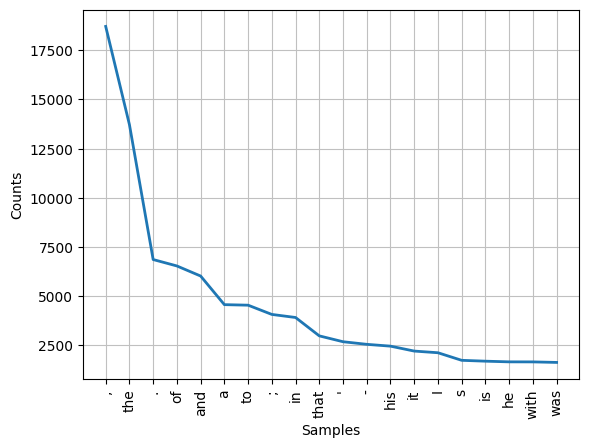

In [35]:
fdist.plot(20)
plt.show()

##### Distribuciones sobre el contenido con filtro-fino

In [36]:
long_words = [word for word in text1 if len(word) > 5]
vocabulario_filtrado = sorted(set(long_words))
vocabulario_filtrado[:10]

['ACCOUNT',
 'ADDITIONAL',
 'ADVANCING',
 'ADVENTURES',
 'AFFGHANISTAN',
 'AFRICA',
 'AGAINST',
 'ALFRED',
 'ALGERINE',
 'AMERICA']

In [37]:
palabras_interesantes = [
    (palabra, fdist[palabra])
    for palabra in set(text1)
    if len(palabra) > 5 and fdist[palabra] > 10
]

palabras_interesantes

[('quantity', 13),
 ('stroke', 16),
 ('seldom', 24),
 ('Lakeman', 24),
 ('coiled', 11),
 ('However', 15),
 ('floating', 24),
 ('mentioned', 18),
 ('direction', 15),
 ('commander', 16),
 ('boiling', 15),
 ('object', 39),
 ('suppose', 35),
 ('disappeared', 15),
 ('reaching', 12),
 ('double', 16),
 ('bucket', 15),
 ('monster', 49),
 ('darting', 14),
 ('happened', 16),
 ('madness', 16),
 ('hammer', 30),
 ('character', 14),
 ('heaving', 15),
 ('bearing', 25),
 ('turning', 52),
 ('stranded', 12),
 ('ourselves', 15),
 ('capstan', 12),
 ('somewhere', 23),
 ('instances', 30),
 ('concerning', 38),
 ('civilized', 16),
 ('thousand', 51),
 ('capture', 14),
 ('sounding', 13),
 ('different', 24),
 ('therefore', 56),
 ('prophet', 13),
 ('ambergris', 12),
 ('horrible', 14),
 ('Therefore', 11),
 ('consider', 15),
 ('nations', 12),
 ('Elijah', 15),
 ('indeed', 82),
 ('vapour', 15),
 ('lowering', 17),
 ('Leviathan', 64),
 ('wonders', 13),
 ('previously', 17),
 ('hunter', 16),
 ('manned', 13),
 ('SAILOR', 

In [38]:
dtypes = [('word', 'U10'), ('frequency', np.int8)]
palabras_interesantes = np.array(palabras_interesantes, dtype=dtypes)
palabras_interesantes

C:\Users\samaf\AppData\Local\Temp\ipykernel_22104\1674039339.py:2: DeprecationWarning: NumPy will stop allowing conversion of out-of-bound Python integers to integer arrays.  The conversion of 252 to int8 will fail in the future.
For the old behavior, usually:
    np.array(value).astype(dtype)`
will give the desired result (the cast overflows).
  palabras_interesantes = np.array(palabras_interesantes, dtype=dtypes)
C:\Users\samaf\AppData\Local\Temp\ipykernel_22104\1674039339.py:2: DeprecationWarning: NumPy will stop allowing conversion of out-of-bound Python integers to integer arrays.  The conversion of 203 to int8 will fail in the future.
For the old behavior, usually:
    np.array(value).astype(dtype)`
will give the desired result (the cast overflows).
  palabras_interesantes = np.array(palabras_interesantes, dtype=dtypes)
C:\Users\samaf\AppData\Local\Temp\ipykernel_22104\1674039339.py:2: DeprecationWarning: NumPy will stop allowing conversion of out-of-bound Python integers to inte

array([('quantity',   13), ('stroke',   16), ('seldom',   24),
       ('Lakeman',   24), ('coiled',   11), ('However',   15),
       ('floating',   24), ('mentioned',   18), ('direction',   15),
       ('commander',   16), ('boiling',   15), ('object',   39),
       ('suppose',   35), ('disappeare',   15), ('reaching',   12),
       ('double',   16), ('bucket',   15), ('monster',   49),
       ('darting',   14), ('happened',   16), ('madness',   16),
       ('hammer',   30), ('character',   14), ('heaving',   15),
       ('bearing',   25), ('turning',   52), ('stranded',   12),
       ('ourselves',   15), ('capstan',   12), ('somewhere',   23),
       ('instances',   30), ('concerning',   38), ('civilized',   16),
       ('thousand',   51), ('capture',   14), ('sounding',   13),
       ('different',   24), ('therefore',   56), ('prophet',   13),
       ('ambergris',   12), ('horrible',   14), ('Therefore',   11),
       ('consider',   15), ('nations',   12), ('Elijah',   15),
       ('

In [39]:
palabras_interesantes = np.sort(palabras_interesantes, order='frequency')
palabras_interesantes

array([('against', -124), ('things', -124), ('thought', -107),
       ('CHAPTER', -106), ('without', -102), ('Pequod',  -84),
       ('should',  -75), ('almost',  -70), ('Starbuck',  -60),
       ('himself',  -53), ('Captain',  -41), ('through',  -29),
       ('whales',  -19), ('little',   -9), ('Queequeg',   -4),
       ('America',   11), ('Father',   11), ('Fleece',   11),
       ('Guernsey',   11), ('Heaven',   11), ('NANTUCKET',   11),
       ('Perseus',   11), ('Ramadan',   11), ('Therefore',   11),
       ('additional',   11), ('advanced',   11), ('appearance',   11),
       ('baleen',   11), ('barbaric',   11), ('beating',   11),
       ('begins',   11), ('beholding',   11), ('belong',   11),
       ('blackness',   11), ('blanket',   11), ('blessed',   11),
       ('butter',   11), ('central',   11), ('clothes',   11),
       ('coiled',   11), ('commotion',   11), ('concluding',   11),
       ('contact',   11), ('convenient',   11), ('covered',   11),
       ('cursed',   11), ('

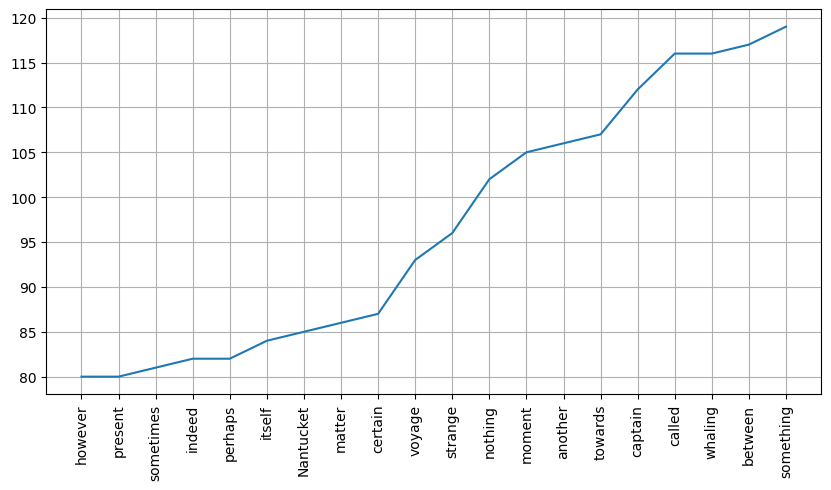

In [40]:
top_words = 20
x = np.arange(len(palabras_interesantes[-top_words:]))
y = [freq[1] for freq in palabras_interesantes[-top_words:]]

plt.figure(figsize=(10, 5))
plt.plot(x, y)
plt.xticks(
    x,
    [str(freq[0]) for freq in palabras_interesantes[-top_words:]],
    rotation='vertical'
)
plt.grid(True)
plt.show()

### Language with statistics

In [41]:
from nltk.util import bigrams, ngrams
import plotly.express as px

#### Bi-gramas

* Parejas de palabras que ocurren consecutivamente

In [42]:
md_bigrams = list(bigrams(text1))
fdist = FreqDist(md_bigrams)
fdist

FreqDist({(',', 'and'): 2607, ('of', 'the'): 1847, ("'", 's'): 1737, ('in', 'the'): 1120, (',', 'the'): 908, (';', 'and'): 853, ('to', 'the'): 712, ('.', 'But'): 596, (',', 'that'): 584, ('.', '"'): 557, ...})

Aquí podemos tener los bi-gramas más frecuentes en este texto:

In [43]:
fdist.most_common(10)

[((',', 'and'), 2607),
 (('of', 'the'), 1847),
 (("'", 's'), 1737),
 (('in', 'the'), 1120),
 ((',', 'the'), 908),
 ((';', 'and'), 853),
 (('to', 'the'), 712),
 (('.', 'But'), 596),
 ((',', 'that'), 584),
 (('.', '"'), 557)]

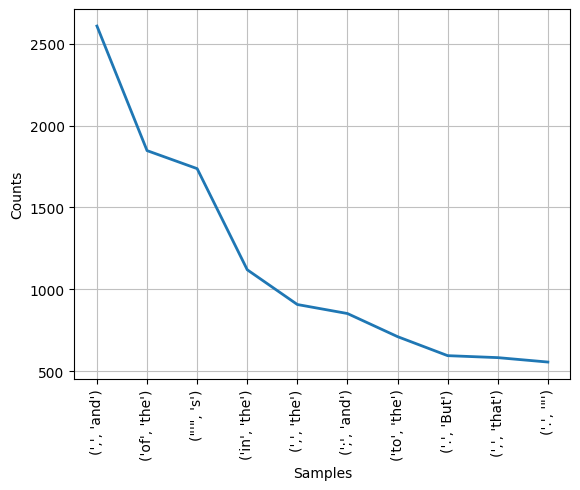

<Axes: xlabel='Samples', ylabel='Counts'>

In [44]:
fdist.plot(10)

##### Filtrado de bi-gramas

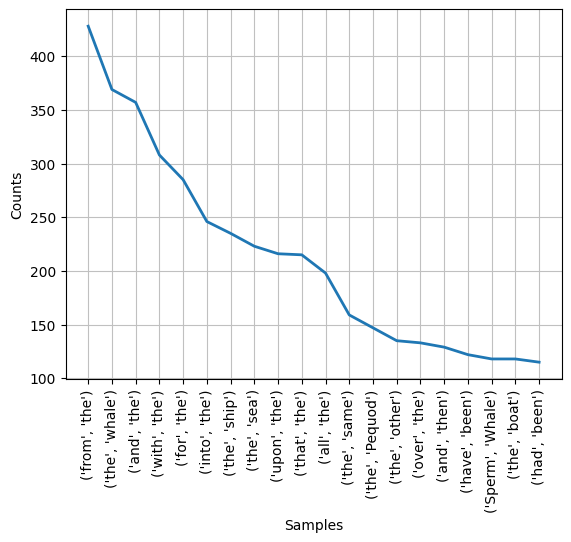

In [45]:
threshold = 2
filtered_bigrams = [
    bigram
    for bigram in md_bigrams
    if len(bigram[0]) > threshold and len(bigram[1]) > threshold
]
filtered_dist = FreqDist(filtered_bigrams)
filtered_dist.plot(20)
plt.show()

#### Tri-gramas

In [46]:
md_trigrams = list(ngrams(text1, 3))
fdist = FreqDist(md_trigrams)
fdist.most_common(10)

[((',', 'and', 'the'), 187),
 (('don', "'", 't'), 103),
 (('of', 'the', 'whale'), 101),
 ((',', 'in', 'the'), 93),
 ((',', 'then', ','), 87),
 (('whale', "'", 's'), 81),
 (('.', 'It', 'was'), 81),
 (('ship', "'", 's'), 80),
 (('the', 'Sperm', 'Whale'), 77),
 ((',', 'as', 'if'), 76)]

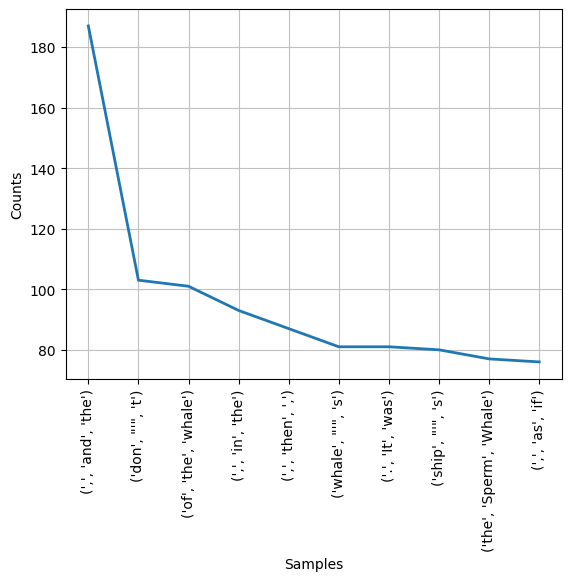

In [47]:
fdist.plot(10)
plt.show()

#### Collocations (Colocaciones)

* Son secuencias de palabras que suelen ocurrir en textos o conversaciones con una **frecuencia inusualmente alta**
* Las colocaciones de una palabra son declaraciones formales de donde suele ubicarse típicamente esa palabra

In [48]:
md_bigrams = list(bigrams(text1))

threshold = 2
filtered_bigrams = [
    bigram
    for bigram in md_bigrams
    if len(bigram[0]) > threshold and len(bigram[1]) > threshold
]
filtered_bigram_dist = FreqDist(filtered_bigrams)

In [49]:
filtered_words = [word for word in text1 if len(word) > threshold]
filtered_word_dist = FreqDist(filtered_words)

In [50]:
df = pd.DataFrame()
df['bi_grams'] = list(set(filtered_bigrams))
df['word_0'] = df['bi_grams'].apply(lambda x: x[0])
df['word_1'] = df['bi_grams'].apply(lambda x: x[1])
df['bi_gram_freq'] = df['bi_grams'].apply(lambda x: filtered_bigram_dist[x])
df['word_0_freq'] = df['word_0'].apply(lambda x: filtered_word_dist[x])
df['word_1_freq'] = df['word_1'].apply(lambda x: filtered_word_dist[x])
df

,bi_grams,word_0,word_1,bi_gram_freq,word_0_freq,word_1_freq
0,"(can, kill)",can,kill,2,220,30
1,"(and, West)",and,West,2,6024,11
2,"(almost, that)",almost,that,1,186,2982
3,"(technicals, called)",technicals,called,1,1,116
4,"(ways, put)",ways,put,1,20,72
...,...,...,...,...,...,...
67937,"(his, insular)",his,insular,1,2459,4
67938,"(the, coals)",the,coals,1,13721,5
67939,"(,--, That)",",--",That,1,86,85
67940,"(gallantly, wave)",gallantly,wave,1,1,10


#### Pointwise Mutual Information (PMI)

Una métrica basada en teoría de la información para encontrar **Collocations**

$$PMI = \log{\frac{P(w_1, w_2)}{P(w_1) P(w_2)}}$$

In [51]:
df['PMI'] = df[
    ['bi_gram_freq', 'word_0_freq', 'word_1_freq']
].apply(lambda x: np.log2(x.values[0] / (x.values[1] * x.values[2])), axis=1)

df

,bi_grams,word_0,word_1,bi_gram_freq,word_0_freq,word_1_freq,PMI
0,"(can, kill)",can,kill,2,220,30,-11.688250
1,"(and, West)",and,West,2,6024,11,-15.015938
2,"(almost, that)",almost,that,1,186,2982,-19.081223
3,"(technicals, called)",technicals,called,1,1,116,-6.857981
4,"(ways, put)",ways,put,1,20,72,-10.491853
...,...,...,...,...,...,...,...
67937,"(his, insular)",his,insular,1,2459,4,-13.263856
67938,"(the, coals)",the,coals,1,13721,5,-16.066026
67939,"(,--, That)",",--",That,1,86,85,-12.835656
67940,"(gallantly, wave)",gallantly,wave,1,1,10,-3.321928


In [52]:
df.sort_values(by='PMI', ascending=False)

,bi_grams,word_0,word_1,bi_gram_freq,word_0_freq,word_1_freq,PMI
57301,"(unsignifying, pettiness)",unsignifying,pettiness,1,1,1,0.000000
63162,"(TWISTED, OAKUM)",TWISTED,OAKUM,1,1,1,0.000000
3918,"(contrastingly, concurred)",contrastingly,concurred,1,1,1,0.000000
30929,"(clammy, reception)",clammy,reception,1,1,1,0.000000
44223,"(hastily, slewing)",hastily,slewing,1,1,1,0.000000
...,...,...,...,...,...,...,...
15584,"(man, the)",man,the,1,508,13721,-22.732783
41093,"(some, the)",some,the,1,578,13721,-22.919024
39835,"(one, the)",one,the,1,889,13721,-23.540138
46095,"(the, not)",the,not,1,13721,1103,-23.851315


In [53]:
df['log(bi_gram_freq)'] = df['bi_gram_freq'].apply(lambda x: np.log2(x))
df

,bi_grams,word_0,word_1,bi_gram_freq,word_0_freq,word_1_freq,PMI,log(bi_gram_freq)
0,"(can, kill)",can,kill,2,220,30,-11.688250,1.0
1,"(and, West)",and,West,2,6024,11,-15.015938,1.0
2,"(almost, that)",almost,that,1,186,2982,-19.081223,0.0
3,"(technicals, called)",technicals,called,1,1,116,-6.857981,0.0
4,"(ways, put)",ways,put,1,20,72,-10.491853,0.0
...,...,...,...,...,...,...,...,...
67937,"(his, insular)",his,insular,1,2459,4,-13.263856,0.0
67938,"(the, coals)",the,coals,1,13721,5,-16.066026,0.0
67939,"(,--, That)",",--",That,1,86,85,-12.835656,0.0
67940,"(gallantly, wave)",gallantly,wave,1,1,10,-3.321928,0.0


In [54]:
fig = px.scatter(
    x=df['PMI'].values,
    y=df['log(bi_gram_freq)'].values,
    color=df['PMI'] + df['log(bi_gram_freq)'],
    hover_name=df['bi_grams'].values,
    width=600,
    height=600,
    labels={'x': 'PMI', 'y': 'Log(Bigram frequency)'}
)
fig.show()

#### Medidas pre-construidas en NLTK

In [55]:
from nltk.collocations import BigramAssocMeasures, BigramCollocationFinder

In [56]:
bigram_measure = BigramAssocMeasures()
finder = BigramCollocationFinder.from_words(text1)

finder.apply_freq_filter(20)
finder.nbest(bigram_measure.pmi, 10)

[('Moby', 'Dick'),
 ('Sperm', 'Whale'),
 ('White', 'Whale'),
 ('Right', 'Whale'),
 ('Captain', 'Peleg'),
 (',"', 'said'),
 ('never', 'mind'),
 ('!"', 'cried'),
 ('no', 'means'),
 ('each', 'other')]

#### Texto en español

In [57]:
corpus = nltk.corpus.cess_esp.sents()
flatten_corpus = list(chain.from_iterable(corpus))
flatten_corpus[:10]

['El',
 'grupo',
 'estatal',
 'Electricité_de_France',
 '-Fpa-',
 'EDF',
 '-Fpt-',
 'anunció',
 'hoy',
 ',']

In [58]:
finder = BigramCollocationFinder.from_documents(corpus)
finder.apply_freq_filter(10)
finder.nbest(bigram_measure.pmi, 10)

[('señora', 'Aguirre'),
 ('secretario', 'general'),
 ('elecciones', 'generales'),
 ('campaña', 'electoral'),
 ('quiere', 'decir'),
 ('Se', 'trata'),
 ('segunda', 'vuelta'),
 ('director', 'general'),
 ('primer', 'ministro'),
 ('primer', 'lugar')]

### Recursos Léxicos

* Son colecciones de palabras o frases que tienen asociadas etiquetas o meta-información de algún tipo (POS tags, significados gramaticales, etc...)

**comentario:** POS (Part of Speech), también llamado etiquetado gramatical o etiquetado de palabras por categoría, consiste en etiquetar la categoría a la que pertenece cada palabra en un volumen de texto, siendo las categorías:
1. Sustantivos
2. Adjetivos
3. Artículos
4. Pronombres
5. Verbos
6. Adverbios
7. Interjecciones
8. Preposiciones
9. Conjunciones

In [59]:
from nltk.corpus import stopwords

In [60]:
# Vocabularios: palabras únicas en un corpus
vocab = sorted(set(text1))
vocab[:10]

['!', '!"', '!"--', "!'", '!\'"', '!)', '!)"', '!*', '!--', '!--"']

In [61]:
# Distribuciones: frecuencia de aparición
word_freq = FreqDist(text1)
word_freq.most_common(10)

[(',', 18713),
 ('the', 13721),
 ('.', 6862),
 ('of', 6536),
 ('and', 6024),
 ('a', 4569),
 ('to', 4542),
 (';', 4072),
 ('in', 3916),
 ('that', 2982)]

In [62]:
# Stopwords: Palabras muy usadas en el lenguaje que usualmente son filtradas en
# pipeline de NLP (useless word)
stopwords.words('spanish')

['de',
 'la',
 'que',
 'el',
 'en',
 'y',
 'a',
 'los',
 'del',
 'se',
 'las',
 'por',
 'un',
 'para',
 'con',
 'no',
 'una',
 'su',
 'al',
 'lo',
 'como',
 'más',
 'pero',
 'sus',
 'le',
 'ya',
 'o',
 'este',
 'sí',
 'porque',
 'esta',
 'entre',
 'cuando',
 'muy',
 'sin',
 'sobre',
 'también',
 'me',
 'hasta',
 'hay',
 'donde',
 'quien',
 'desde',
 'todo',
 'nos',
 'durante',
 'todos',
 'uno',
 'les',
 'ni',
 'contra',
 'otros',
 'ese',
 'eso',
 'ante',
 'ellos',
 'e',
 'esto',
 'mí',
 'antes',
 'algunos',
 'qué',
 'unos',
 'yo',
 'otro',
 'otras',
 'otra',
 'él',
 'tanto',
 'esa',
 'estos',
 'mucho',
 'quienes',
 'nada',
 'muchos',
 'cual',
 'poco',
 'ella',
 'estar',
 'estas',
 'algunas',
 'algo',
 'nosotros',
 'mi',
 'mis',
 'tú',
 'te',
 'ti',
 'tu',
 'tus',
 'ellas',
 'nosotras',
 'vosotros',
 'vosotras',
 'os',
 'mío',
 'mía',
 'míos',
 'mías',
 'tuyo',
 'tuya',
 'tuyos',
 'tuyas',
 'suyo',
 'suya',
 'suyos',
 'suyas',
 'nuestro',
 'nuestra',
 'nuestros',
 'nuestras',
 'vuestro'

#### Fracción de Stopwords en un corpus

In [63]:
def stopwords_percentage(text):
    stopwd = stopwords.words('english')
    content = [w for w in text if w.lower() not in stopwd]
    return len(content) / len(text)

stopwords_percentage(text1)

0.5862954769399469

#### Lexicons enriquecidos (listas comparativas de palabras)

* Construyendo diccionarios para traducción de palabras en diferentes idiomas.

In [64]:
from nltk.corpus import swadesh

swadesh.fileids()  # languages

['be',
 'bg',
 'bs',
 'ca',
 'cs',
 'cu',
 'de',
 'en',
 'es',
 'fr',
 'hr',
 'it',
 'la',
 'mk',
 'nl',
 'pl',
 'pt',
 'ro',
 'ru',
 'sk',
 'sl',
 'sr',
 'sw',
 'uk']

In [65]:
swadesh.words('en')

['I',
 'you (singular), thou',
 'he',
 'we',
 'you (plural)',
 'they',
 'this',
 'that',
 'here',
 'there',
 'who',
 'what',
 'where',
 'when',
 'how',
 'not',
 'all',
 'many',
 'some',
 'few',
 'other',
 'one',
 'two',
 'three',
 'four',
 'five',
 'big',
 'long',
 'wide',
 'thick',
 'heavy',
 'small',
 'short',
 'narrow',
 'thin',
 'woman',
 'man (adult male)',
 'man (human being)',
 'child',
 'wife',
 'husband',
 'mother',
 'father',
 'animal',
 'fish',
 'bird',
 'dog',
 'louse',
 'snake',
 'worm',
 'tree',
 'forest',
 'stick',
 'fruit',
 'seed',
 'leaf',
 'root',
 'bark (from tree)',
 'flower',
 'grass',
 'rope',
 'skin',
 'meat',
 'blood',
 'bone',
 'fat (noun)',
 'egg',
 'horn',
 'tail',
 'feather',
 'hair',
 'head',
 'ear',
 'eye',
 'nose',
 'mouth',
 'tooth',
 'tongue',
 'fingernail',
 'foot',
 'leg',
 'knee',
 'hand',
 'wing',
 'belly',
 'guts',
 'neck',
 'back',
 'breast',
 'heart',
 'liver',
 'drink',
 'eat',
 'bite',
 'suck',
 'spit',
 'vomit',
 'blow',
 'breathe',
 'laugh',

In [66]:
fr2es = swadesh.entries(['fr', 'es'])

fr2es

[('je', 'yo'),
 ('tu, vous', 'tú, usted'),
 ('il', 'él'),
 ('nous', 'nosotros'),
 ('vous', 'vosotros, ustedes'),
 ('ils, elles', 'ellos, ellas'),
 ('ceci', 'este'),
 ('cela', 'ese, aquel'),
 ('ici', 'aquí, acá'),
 ('là', 'ahí, allí, allá'),
 ('qui', 'quien'),
 ('quoi', 'que'),
 ('où', 'donde'),
 ('quand', 'cuando'),
 ('comment', 'como'),
 ('ne...pas', 'no'),
 ('tout', 'todo'),
 ('plusieurs', 'muchos'),
 ('quelques', 'algunos, unos'),
 ('peu', 'poco'),
 ('autre', 'otro'),
 ('un', 'uno'),
 ('deux', 'dos'),
 ('trois', 'tres'),
 ('quatre', 'cuatro'),
 ('cinq', 'cinco'),
 ('grand', 'grande'),
 ('long', 'largo'),
 ('large', 'ancho'),
 ('épais', 'gordo'),
 ('lourd', 'pesado'),
 ('petit', 'pequeño'),
 ('court', 'corto'),
 ('étroit', 'estrecho, angosto'),
 ('mince', 'delgado, flaco'),
 ('femme', 'mujer'),
 ('homme', 'hombre'),
 ('homme', 'hombre'),
 ('enfant', 'niño'),
 ('femme, épouse', 'esposa, mujer'),
 ('mari, époux', 'esposo, marido'),
 ('mère', 'madre'),
 ('père', 'padre'),
 ('animal', 'a

In [67]:
translate = dict(fr2es)
translate['chien']

'perro'

In [68]:
translate['jeter']

'tirar'

### WordNet

In [69]:
nltk.download('wordnet')
nltk.download('omw')  # WordNet en español
nltk.download('omw-1.4')

from nltk.corpus import wordnet as wn

[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\samaf\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package omw to
[nltk_data]     C:\Users\samaf\AppData\Roaming\nltk_data...
[nltk_data]   Package omw is already up-to-date!
[nltk_data] Downloading package omw-1.4 to
[nltk_data]     C:\Users\samaf\AppData\Roaming\nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!


In [70]:
# synsets: grupo de sinónimos
ss = wn.synsets('carro', lang='spa')
ss

[Synset('car.n.01'),
 Synset('carriage.n.04'),
 Synset('carrier.n.02'),
 Synset('cart.n.01'),
 Synset('chariot.n.02'),
 Synset('cartload.n.01')]

In [71]:
# explorar synsets
for syn in ss:
    print(f'{syn.name()}: {syn.definition()}')
    for name in syn.lemma_names():
        print(f' * {name}')

car.n.01: a motor vehicle with four wheels; usually propelled by an internal combustion engine
 * car
 * auto
 * automobile
 * machine
 * motorcar
carriage.n.04: a machine part that carries something else
 * carriage
carrier.n.02: a self-propelled wheeled vehicle designed specifically to carry something
 * carrier
cart.n.01: a heavy open wagon usually having two wheels and drawn by an animal
 * cart
chariot.n.02: a two-wheeled horse-drawn battle vehicle; used in war and races in ancient Egypt and Greece and Rome
 * chariot
cartload.n.01: the quantity that a cart holds
 * cartload


In [72]:
import networkx as nx

def clousure_graph(synset, fn):
  seen = set()
  graph = nx.DiGraph()
  labels = {}

  def recurse(s):
    if s not in seen:
      seen.add(s)
      labels[s.name] = s.name().split('.')[0]
      graph.add_node(s.name)
      for s1 in fn(s):
        graph.add_node(s1.name)
        graph.add_edge(s.name, s1.name)
        recurse(s1)

  recurse(synset)
  return graph, labels

def draw_text_graph(G, labels):
  plt.figure(figsize=(18, 12))
  pos = nx.planar_layout(G, scale=18)
  nx.draw_networkx_nodes(G, pos, node_color="red", linewidths=0, node_size=500)
  nx.draw_networkx_labels(G, pos, font_size=20, labels=labels)
  nx.draw_networkx_edges(G, pos)
  plt.xticks([])
  plt.yticks([])

#### **Hyponyms**: Conceptos que son más específicos que la palabra raíz de la cual derivan

In [73]:
ss[0].hyponyms()

[Synset('ambulance.n.01'),
 Synset('beach_wagon.n.01'),
 Synset('bus.n.04'),
 Synset('cab.n.03'),
 Synset('compact.n.03'),
 Synset('convertible.n.01'),
 Synset('coupe.n.01'),
 Synset('cruiser.n.01'),
 Synset('electric.n.01'),
 Synset('gas_guzzler.n.01'),
 Synset('hardtop.n.01'),
 Synset('hatchback.n.01'),
 Synset('horseless_carriage.n.01'),
 Synset('hot_rod.n.01'),
 Synset('jeep.n.01'),
 Synset('limousine.n.01'),
 Synset('loaner.n.02'),
 Synset('minicar.n.01'),
 Synset('minivan.n.01'),
 Synset('model_t.n.01'),
 Synset('pace_car.n.01'),
 Synset('racer.n.02'),
 Synset('roadster.n.01'),
 Synset('sedan.n.01'),
 Synset('sport_utility.n.01'),
 Synset('sports_car.n.01'),
 Synset('stanley_steamer.n.01'),
 Synset('stock_car.n.01'),
 Synset('subcompact.n.01'),
 Synset('touring_car.n.01'),
 Synset('used-car.n.01')]

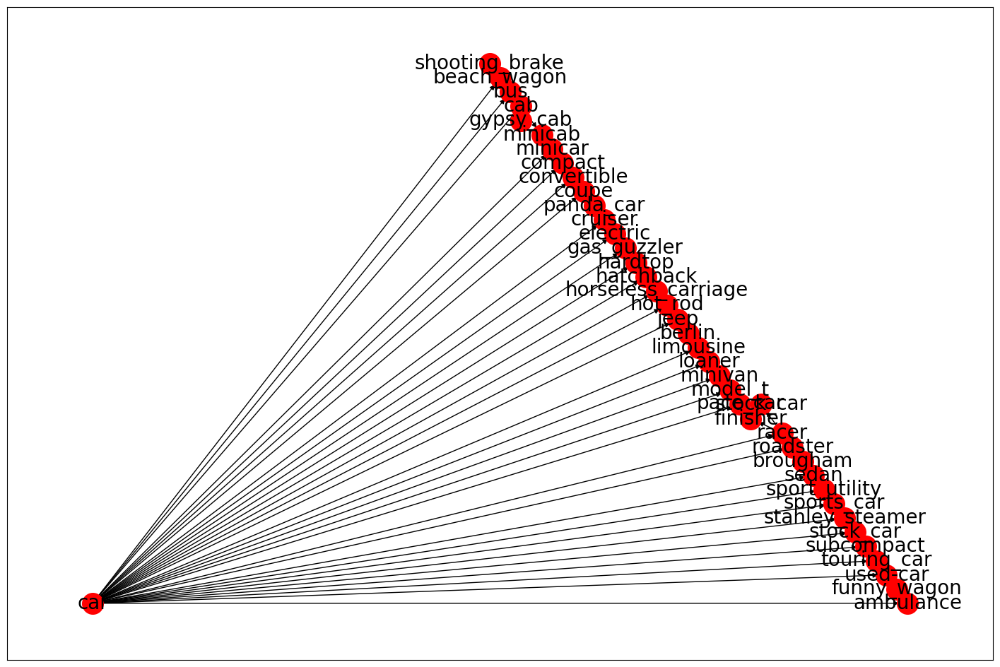

In [74]:
G, labels = clousure_graph(ss[0], fn=lambda s: s.hyponyms())
draw_text_graph(G, labels)

#### **Hypernyms:** conceptos que son más generales!

In [75]:
ss[0].hypernyms()

[Synset('motor_vehicle.n.01')]

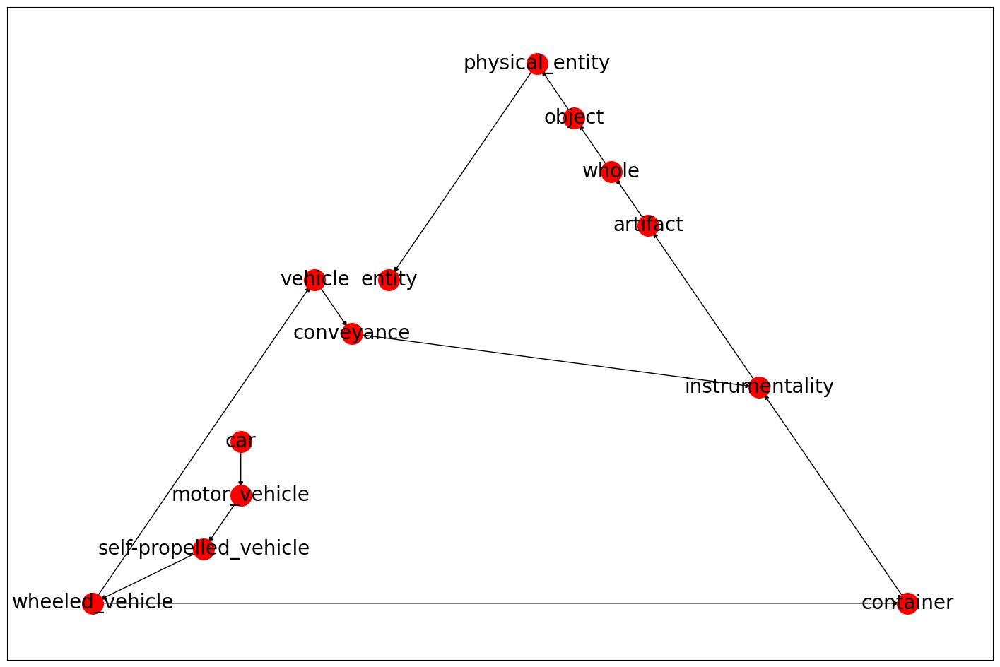

In [76]:
G, labels = clousure_graph(ss[0], fn=lambda s: s.hypernyms())
draw_text_graph(G, labels)

#### Similitud semántica

In [77]:
def show_syns(word):
    ss = wn.synsets(word, lang='spa')
    for syn in ss:
        print(f'{syn.name()}: {syn.definition()}')
        for name in syn.lemma_names():
            print(f' * {name}')
    return ss

In [78]:
ss = show_syns('perro')

dog.n.01: a member of the genus Canis (probably descended from the common wolf) that has been domesticated by man since prehistoric times; occurs in many breeds
 * dog
 * domestic_dog
 * Canis_familiaris
rotter.n.01: a person who is deemed to be despicable or contemptible
 * rotter
 * dirty_dog
 * rat
 * skunk
 * stinker
 * stinkpot
 * bum
 * puke
 * crumb
 * lowlife
 * scum_bag
 * so-and-so
 * git


In [79]:
ss2 = show_syns('gato')

cat.n.01: feline mammal usually having thick soft fur and no ability to roar: domestic cats; wildcats
 * cat
 * true_cat
tom.n.02: male cat
 * tom
 * tomcat
dodger.n.01: a shifty deceptive person
 * dodger
 * fox
 * slyboots


In [80]:
ss3 = show_syns('animal')

animal.n.01: a living organism characterized by voluntary movement
 * animal
 * animate_being
 * beast
 * brute
 * creature
 * fauna
beast.n.02: a cruelly rapacious person
 * beast
 * wolf
 * savage
 * brute
 * wildcat
dunce.n.01: a stupid person; these words are used to express a low opinion of someone's intelligence
 * dunce
 * dunderhead
 * numskull
 * blockhead
 * bonehead
 * lunkhead
 * hammerhead
 * knucklehead
 * loggerhead
 * muttonhead
 * shithead
 * dumbass
 * fuckhead


In [81]:
perro = ss[0]
gato = ss2[0]
animal = ss3[0]

In [82]:
animal.path_similarity(perro)

0.3333333333333333

In [83]:
animal.path_similarity(gato)

0.125

In [84]:
perro.path_similarity(perro)

1.0

### Procesamiento de texto plano

In [85]:
nltk.download('punkt')
nltk.download('stopwords')

from nltk import word_tokenize
from urllib import request

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\samaf\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\samaf\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [87]:
URL = 'http://www.gutenberg.org/files/2554/2554-0.txt'
response = request.urlopen(URL)
raw = response.read().decode('utf-8')
print(raw)

The Project Gutenberg eBook of Crime and Punishment, by Fyodor Dostoevsky

This eBook is for the use of anyone anywhere in the United States and
most other parts of the world at no cost and with almost no restrictions
whatsoever. You may copy it, give it away or re-use it under the terms
of the Project Gutenberg License included with this eBook or online at
www.gutenberg.org. If you are not located in the United States, you
will have to check the laws of the country where you are located before
using this eBook.

Title: Crime and Punishment

Author: Fyodor Dostoevsky

Translator: Constance Garnett

Release Date: March, 2001 [eBook #2554]
[Most recently updated: August 6, 2021]

Language: English

Character set encoding: UTF-8

Produced by: John Bickers, Dagny and David Widger

*** START OF THE PROJECT GUTENBERG EBOOK CRIME AND PUNISHMENT ***




CRIME AND PUNISHMENT

By Fyodor Dostoevsky



Translated By Constance Garnett




TRANSLATOR’S PREFACE

A few words about Dostoevsky himself m

In [88]:
raw

'\ufeffThe Project Gutenberg eBook of Crime and Punishment, by Fyodor Dostoevsky\r\n\r\nThis eBook is for the use of anyone anywhere in the United States and\r\nmost other parts of the world at no cost and with almost no restrictions\r\nwhatsoever. You may copy it, give it away or re-use it under the terms\r\nof the Project Gutenberg License included with this eBook or online at\r\nwww.gutenberg.org. If you are not located in the United States, you\r\nwill have to check the laws of the country where you are located before\r\nusing this eBook.\r\n\r\nTitle: Crime and Punishment\r\n\r\nAuthor: Fyodor Dostoevsky\r\n\r\nTranslator: Constance Garnett\r\n\r\nRelease Date: March, 2001 [eBook #2554]\r\n[Most recently updated: August 6, 2021]\r\n\r\nLanguage: English\r\n\r\nCharacter set encoding: UTF-8\r\n\r\nProduced by: John Bickers, Dagny and David Widger\r\n\r\n*** START OF THE PROJECT GUTENBERG EBOOK CRIME AND PUNISHMENT ***\r\n\r\n\r\n\r\n\r\nCRIME AND PUNISHMENT\r\n\r\nBy Fyodor Dostoev

In [89]:
len(raw)

1176812

In [91]:
tokens = word_tokenize(raw)
tokens[:20]

['\ufeffThe',
 'Project',
 'Gutenberg',
 'eBook',
 'of',
 'Crime',
 'and',
 'Punishment',
 ',',
 'by',
 'Fyodor',
 'Dostoevsky',
 'This',
 'eBook',
 'is',
 'for',
 'the',
 'use',
 'of',
 'anyone']

In [92]:
text = nltk.Text(tokens)
text.collocations()

Katerina Ivanovna; Pyotr Petrovitch; Pulcheria Alexandrovna; Avdotya
Romanovna; Rodion Romanovitch; Marfa Petrovna; Sofya Semyonovna; old
woman; Project Gutenberg-tm; Porfiry Petrovitch; Amalia Ivanovna;
great deal; young man; Nikodim Fomitch; Project Gutenberg; Ilya
Petrovitch; Andrey Semyonovitch; Hay Market; Dmitri Prokofitch; Good
heavens


### Procesamiento de HTML

In [93]:
from nltk.tokenize import RegexpTokenizer

In [94]:
URL = 'https://www.gutenberg.org/files/2701/2701-h/2701-h.htm'
r = requests.get(URL)
html = r.text
html

'<!DOCTYPE html PUBLIC "-//W3C//DTD XHTML 1.0 Strict//EN"\r\n"http://www.w3.org/TR/xhtml1/DTD/xhtml1-strict.dtd">\r\n<html xmlns="http://www.w3.org/1999/xhtml" xml:lang="en" lang="en">\r\n<head>\r\n<meta http-equiv="Content-Type" content="text/html;charset=utf-8" />\r\n<meta http-equiv="Content-Style-Type" content="text/css" />\r\n<title>The Project Gutenberg eBook of Moby Dick; Or the Whale, by Herman Melville</title>\r\n\r\n<style type="text/css" xml:space="preserve">\r\n\r\n    body {margin-left:15%; margin-right:15%; text-align:justify }\r\n    p { text-indent: 1em; margin-top: .25em; margin-bottom: .25em; }\r\n    H1,H2,H3,H4,H5,H6 { text-align: center; margin-left: 15%; margin-right: 15%; }\r\n    hr  { width: 50%; text-align: center;}\r\n    blockquote {font-size: 100%; margin-left: 0%; margin-right: 0%;}\r\n    .mynote    {background-color: #DDE; color: #000; padding: .5em; margin-left: 10%; margin-right: 10%; font-family: sans-serif; font-size: 95%;}\r\n    .toc       { margin

In [95]:
soup = BeautifulSoup(html, 'html.parser')
soup

<!DOCTYPE html PUBLIC "-//W3C//DTD XHTML 1.0 Strict//EN"
"http://www.w3.org/TR/xhtml1/DTD/xhtml1-strict.dtd">

<html lang="en" xml:lang="en" xmlns="http://www.w3.org/1999/xhtml">
<head>
<meta content="text/html;charset=utf-8" http-equiv="Content-Type"/>
<meta content="text/css" http-equiv="Content-Style-Type"/>
<title>The Project Gutenberg eBook of Moby Dick; Or the Whale, by Herman Melville</title>
<style type="text/css" xml:space="preserve">

    body {margin-left:15%; margin-right:15%; text-align:justify }
    p { text-indent: 1em; margin-top: .25em; margin-bottom: .25em; }
    H1,H2,H3,H4,H5,H6 { text-align: center; margin-left: 15%; margin-right: 15%; }
    hr  { width: 50%; text-align: center;}
    blockquote {font-size: 100%; margin-left: 0%; margin-right: 0%;}
    .mynote    {background-color: #DDE; color: #000; padding: .5em; margin-left: 10%; margin-right: 10%; font-family: sans-serif; font-size: 95%;}
    .toc       { margin-left: 10%; margin-bottom: .75em;}
    pre        {

In [96]:
text = soup.get_text()
text

'\n\n\n\n\nThe Project Gutenberg eBook of Moby Dick; Or the Whale, by Herman Melville\n\n\n\nThe Project Gutenberg eBook of Moby-Dick; or The Whale, by Herman Melville\n\r\nThis eBook is for the use of anyone anywhere in the United States and\r\nmost other parts of the world at no cost and with almost no restrictions\r\nwhatsoever. You may copy it, give it away or re-use it under the terms\r\nof the Project Gutenberg License included with this eBook or online\r\nat www.gutenberg.org. If you\r\nare not located in the United States, you will have to check the laws of the\r\ncountry where you are located before using this eBook.\r\n\nTitle: Moby-Dick; or The Whale\nAuthor: Herman Melville\nRelease Date: June, 2001 [eBook #2701]\r\n[Most recently updated: August 18, 2021]\nLanguage: English\nCharacter set encoding: UTF-8\nProduced by: Daniel Lazarus, Jonesey, and David Widger\n*** START OF THE PROJECT GUTENBERG EBOOK MOBY-DICK; OR THE WHALE ***\n\r\n      MOBY-DICK;or, THE WHALE.\r\n    \n

In [99]:
tokenizer = RegexpTokenizer('\w+')
tokens = tokenizer.tokenize(text)
tokens[:50]

['The',
 'Project',
 'Gutenberg',
 'eBook',
 'of',
 'Moby',
 'Dick',
 'Or',
 'the',
 'Whale',
 'by',
 'Herman',
 'Melville',
 'The',
 'Project',
 'Gutenberg',
 'eBook',
 'of',
 'Moby',
 'Dick',
 'or',
 'The',
 'Whale',
 'by',
 'Herman',
 'Melville',
 'This',
 'eBook',
 'is',
 'for',
 'the',
 'use',
 'of',
 'anyone',
 'anywhere',
 'in',
 'the',
 'United',
 'States',
 'and',
 'most',
 'other',
 'parts',
 'of',
 'the',
 'world',
 'at',
 'no',
 'cost',
 'and']